     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 39.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 67.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-bio: filename=scikit_bio-0.6.3-cp311-cp311-linux_x86_64.whl size=7242396 sha256=70cf4e131c06e6200dd6ceb2147511ac59a14e478a3a3fedfede3a14ed32583c
  Stored in directory: /root/.cache/pip/wheels/c9/11/a2/86492071506a487bcba7015b710a9e89d66ca69845512fb86c
  Created wheel for biom-format: filename=biom_format-2.1.16-cp311-cp311-linux_x86_64.whl size=12172149 sha256=46f7337a61c9b10e9683fbe27f638de40ce6cc6b5a9e63f1b4d5ff99240cfb58
  Stored in directory: /root/.cache/pip/wheels/a5/6b/58/a879e8fbae2479a3d1a68719f3a062fe62701d6494f1b74f5e
Successf

Saving WGS_Genus.txt to WGS_Genus.txt
Saving 16s_Genus.txt to 16s_Genus.txt


<ipython-input-1-9219988f633f>:60: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_alpha_melt, x='Metric', y='Value', hue='Method',


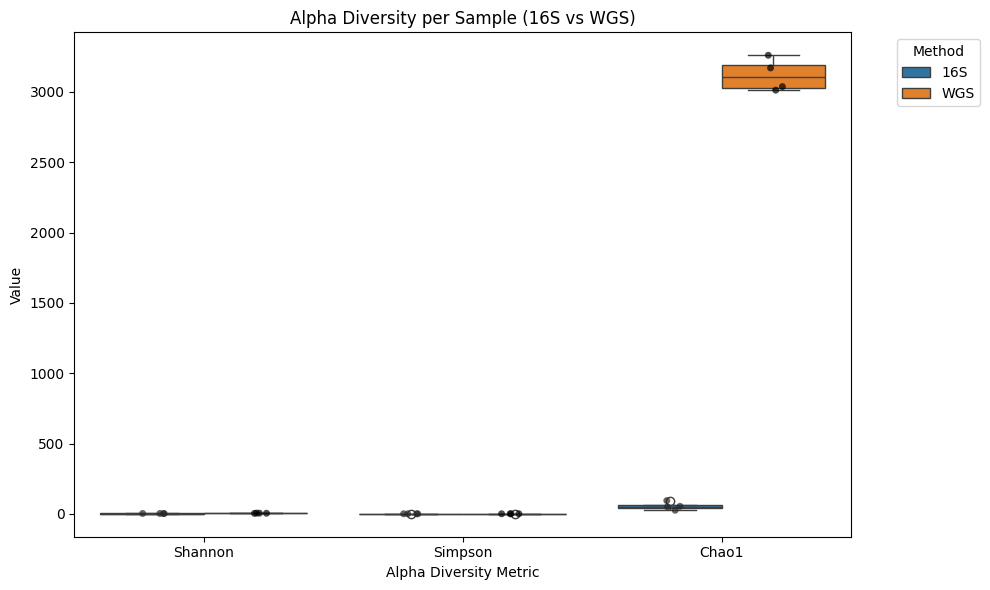

In [ ]:
# 📦 Install required package
!pip install scikit-bio

# 📥 Upload files
import pandas as pd
import io
from google.colab import files
uploaded = files.upload()

# 📄 Read and transpose data
df_16s = pd.read_csv(io.BytesIO(uploaded['16s_Genus.txt']), sep='\t', index_col=0).T
df_wgs = pd.read_csv(io.BytesIO(uploaded['WGS_Genus.txt']), sep='\t', index_col=0).T

# 🧮 Alpha diversity calculation
from skbio.diversity import alpha_diversity

# 16S
shannon_16s = alpha_diversity('shannon', df_16s, ids=df_16s.index)
simpson_16s = alpha_diversity('simpson', df_16s, ids=df_16s.index)
chao1_16s = alpha_diversity('chao1', df_16s, ids=df_16s.index)

df_16s_alpha = pd.DataFrame({
    'SampleID': df_16s.index,
    'Shannon': shannon_16s,
    'Simpson': simpson_16s,
    'Chao1': chao1_16s,
    'Method': '16S'
})

# WGS
shannon_wgs = alpha_diversity('shannon', df_wgs, ids=df_wgs.index)
simpson_wgs = alpha_diversity('simpson', df_wgs, ids=df_wgs.index)
chao1_wgs = alpha_diversity('chao1', df_wgs, ids=df_wgs.index)

df_wgs_alpha = pd.DataFrame({
    'SampleID': df_wgs.index,
    'Shannon': shannon_wgs,
    'Simpson': simpson_wgs,
    'Chao1': chao1_wgs,
    'Method': 'WGS'
})

# 🔗 Combine data
df_alpha = pd.concat([df_16s_alpha, df_wgs_alpha], ignore_index=True)

# 🔄 Melt for plotting
df_alpha_melt = df_alpha.melt(
    id_vars=['SampleID', 'Method'],
    value_vars=['Shannon', 'Simpson', 'Chao1'],
    var_name='Metric',
    value_name='Value'
)

# 📊 Plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_alpha_melt, x='Metric', y='Value', hue='Method')
sns.stripplot(data=df_alpha_melt, x='Metric', y='Value', hue='Method',
              dodge=True, color='black', alpha=0.7)

# Clean legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2], labels[:2], title='Method', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Alpha Diversity per Sample (16S vs WGS)')
plt.xlabel('Alpha Diversity Metric')
plt.ylabel('Value')
plt.tight_layout()
plt.show()


In [ ]:
!pip install scikit-bio pandas matplotlib seaborn


Calculates and prints the Shannon index for each sample and method.

Prints means and 95% confidence intervals for each method.

Calculates and prints paired t-test and Wilcoxon p-values.

Plots a boxplot with colored, connected points for each sample and a legend.

Shannon Diversity Index:
  Sample   Shannon Method
0    AH1  2.687947    16S
1     AK  3.136115    16S
2    AW5  3.248322    16S
3     WM  2.589996    16S
4    AH1  5.125733    WGS
5     AK  3.954702    WGS
6    AW5  4.681926    WGS
7     WM  5.838854    WGS
Shannon 16S: mean=2.92, 95% CI=[2.40, 3.43]
Shannon WGS: mean=4.90, 95% CI=[3.64, 6.16]

Shannon Paired t-test p-value: 0.0345
Shannon Wilcoxon signed-rank p-value: 0.1250


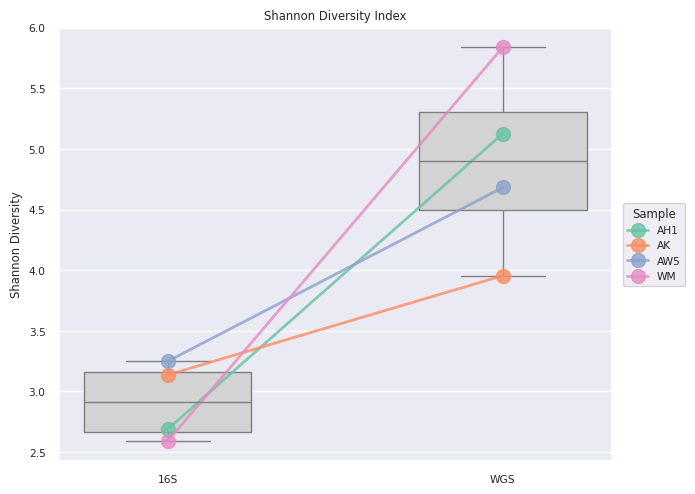

In [ ]:
import pandas as pd
import numpy as np
from skbio.diversity.alpha import shannon
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, wilcoxon, sem, t

# Load abundance tables
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0).T
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0).T
samples = df_16s.index.tolist()

# Calculate Shannon index
shannon_16s = df_16s.apply(lambda x: shannon(x.values), axis=1)
shannon_wgs = df_wgs.apply(lambda x: shannon(x.values), axis=1)

# Combine results
shannon_df = pd.DataFrame({
    'Sample': samples + samples,
    'Shannon': list(shannon_16s.values) + list(shannon_wgs.values),
    'Method': ['16S'] * len(samples) + ['WGS'] * len(samples)
})

# Print results in your requested format
print("Shannon Diversity Index:")
print(shannon_df)

# Print means and 95% CIs
def ci95(data):
    n = len(data)
    m = np.mean(data)
    se_val = sem(data)
    h = se_val * t.ppf((1 + 0.95) / 2., n-1)
    return m, m-h, m+h

for method in ['16S', 'WGS']:
    vals = shannon_df[shannon_df['Method'] == method]['Shannon'].values
    m, lower, upper = ci95(vals)
    print(f"Shannon {method}: mean={m:.2f}, 95% CI=[{lower:.2f}, {upper:.2f}]")

# Paired tests
t_p = ttest_rel(shannon_16s, shannon_wgs).pvalue
w_p = wilcoxon(shannon_16s, shannon_wgs).pvalue
print(f"\nShannon Paired t-test p-value: {t_p:.4f}")
print(f"Shannon Wilcoxon signed-rank p-value: {w_p:.4f}")

# Assign unique color to each sample
palette = sns.color_palette("Set2", n_colors=len(samples))
sample_colors = dict(zip(samples, palette))

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(x='Method', y='Shannon', data=shannon_df, color='lightgray', width=0.5, showfliers=False)
for sample in samples:
    yvals = [
        shannon_df[(shannon_df['Sample'] == sample) & (shannon_df['Method'] == '16S')]['Shannon'].values[0],
        shannon_df[(shannon_df['Sample'] == sample) & (shannon_df['Method'] == 'WGS')]['Shannon'].values[0]
    ]
    plt.plot([0, 1], yvals, marker='o', markersize=10, color=sample_colors[sample], label=sample, linewidth=2, alpha=0.8)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='Sample', bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0.)
plt.title("Shannon Diversity Index")
plt.ylabel("Shannon Diversity")
plt.xlabel("")
plt.xticks([0, 1], ['16S', 'WGS'])
plt.tight_layout()
plt.show()


Simpson Diversity Index:
  Sample   Simpson Method
0    AH1  0.909518    16S
1     AK  0.924868    16S
2    AW5  0.914487    16S
3     WM  0.821723    16S
4    AH1  0.970620    WGS
5     AK  0.896989    WGS
6    AW5  0.962703    WGS
7     WM  0.983923    WGS
Simpson 16S: mean=0.8926, 95% CI=[0.8167, 0.9686]
Simpson WGS: mean=0.9536, 95% CI=[0.8920, 1.0152]

Simpson Paired t-test p-value: 0.2168
Simpson Wilcoxon signed-rank p-value: 0.2500


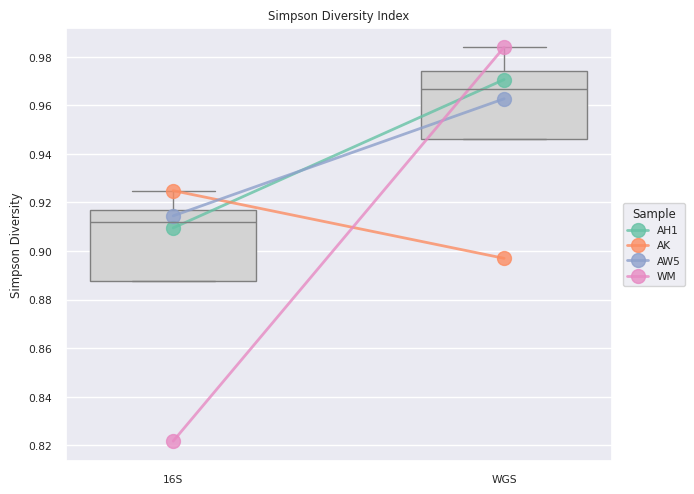

In [ ]:
import pandas as pd
import numpy as np
from skbio.diversity.alpha import simpson
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, wilcoxon, sem, t

# Load data
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0).T
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0).T
samples = df_16s.index.tolist()

# Calculate Simpson index
simpson_16s = df_16s.apply(lambda x: simpson(x.values), axis=1)
simpson_wgs = df_wgs.apply(lambda x: simpson(x.values), axis=1)

# Combine results
simpson_df = pd.DataFrame({
    'Sample': samples + samples,
    'Simpson': list(simpson_16s.values) + list(simpson_wgs.values),
    'Method': ['16S'] * len(samples) + ['WGS'] * len(samples)
})

print("Simpson Diversity Index:")
print(simpson_df)

# Function for 95% CI
def ci95(data):
    n = len(data)
    m = np.mean(data)
    se_val = sem(data)
    h = se_val * t.ppf((1 + 0.95) / 2., n-1)
    return m, m-h, m+h

# Print means and CIs
for method in ['16S', 'WGS']:
    vals = simpson_df[simpson_df['Method'] == method]['Simpson'].values
    m, lower, upper = ci95(vals)
    print(f"Simpson {method}: mean={m:.4f}, 95% CI=[{lower:.4f}, {upper:.4f}]")

# Paired tests
t_p = ttest_rel(simpson_16s, simpson_wgs).pvalue
w_p = wilcoxon(simpson_16s, simpson_wgs).pvalue
print(f"\nSimpson Paired t-test p-value: {t_p:.4f}")
print(f"Simpson Wilcoxon signed-rank p-value: {w_p:.4f}")

# Assign unique color to each sample
palette = sns.color_palette("Set2", n_colors=len(samples))
sample_colors = dict(zip(samples, palette))

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(x='Method', y='Simpson', data=simpson_df, color='lightgray', width=0.5, showfliers=False)
for sample in samples:
    yvals = [
        simpson_df[(simpson_df['Sample'] == sample) & (simpson_df['Method'] == '16S')]['Simpson'].values[0],
        simpson_df[(simpson_df['Sample'] == sample) & (simpson_df['Method'] == 'WGS')]['Simpson'].values[0]
    ]
    plt.plot([0, 1], yvals, marker='o', markersize=10, color=sample_colors[sample], label=sample, linewidth=2, alpha=0.8)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='Sample', bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0.)
plt.title("Simpson Diversity Index")
plt.ylabel("Simpson Diversity")
plt.xlabel("")
plt.xticks([0, 1], ['16S', 'WGS'])
plt.tight_layout()
plt.show()


Chao1 Diversity Index:
  Sample        Chao1 Method
0    AH1    26.000000    16S
1     AK    50.000000    16S
2    AW5    94.500000    16S
3     WM    54.000000    16S
4    AH1  3169.888889    WGS
5     AK  3036.740741    WGS
6    AW5  3259.809524    WGS
7     WM  3011.632653    WGS
Chao1 16S: mean=56.12, 95% CI=[10.91, 101.34]
Chao1 WGS: mean=3119.52, 95% CI=[2934.16, 3304.88]

Chao1 Paired t-test p-value: 0.0000
Chao1 Wilcoxon signed-rank p-value: 0.1250


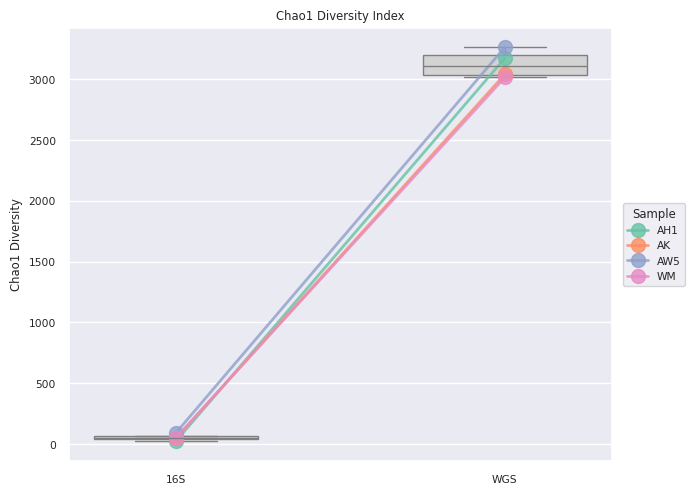

In [ ]:
from skbio.diversity.alpha import chao1

# Calculate Chao1 index
chao1_16s = df_16s.apply(lambda x: chao1(x.values), axis=1)
chao1_wgs = df_wgs.apply(lambda x: chao1(x.values), axis=1)

# Combine results
chao1_df = pd.DataFrame({
    'Sample': samples + samples,
    'Chao1': list(chao1_16s.values) + list(chao1_wgs.values),
    'Method': ['16S'] * len(samples) + ['WGS'] * len(samples)
})

print("Chao1 Diversity Index:")
print(chao1_df)

# Print means and CIs
for method in ['16S', 'WGS']:
    vals = chao1_df[chao1_df['Method'] == method]['Chao1'].values
    m, lower, upper = ci95(vals)
    print(f"Chao1 {method}: mean={m:.2f}, 95% CI=[{lower:.2f}, {upper:.2f}]")

# Paired tests
t_p = ttest_rel(chao1_16s, chao1_wgs).pvalue
w_p = wilcoxon(chao1_16s, chao1_wgs).pvalue
print(f"\nChao1 Paired t-test p-value: {t_p:.4f}")
print(f"Chao1 Wilcoxon signed-rank p-value: {w_p:.4f}")

# Assign unique color to each sample
palette = sns.color_palette("Set2", n_colors=len(samples))
sample_colors = dict(zip(samples, palette))

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(x='Method', y='Chao1', data=chao1_df, color='lightgray', width=0.5, showfliers=False)
for sample in samples:
    yvals = [
        chao1_df[(chao1_df['Sample'] == sample) & (chao1_df['Method'] == '16S')]['Chao1'].values[0],
        chao1_df[(chao1_df['Sample'] == sample) & (chao1_df['Method'] == 'WGS')]['Chao1'].values[0]
    ]
    plt.plot([0, 1], yvals, marker='o', markersize=10, color=sample_colors[sample], label=sample, linewidth=2, alpha=0.8)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='Sample', bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0.)
plt.title("Chao1 Diversity Index")
plt.ylabel("Chao1 Diversity")
plt.xlabel("")
plt.xticks([0, 1], ['16S', 'WGS'])
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from skbio.diversity.alpha import shannon, simpson, chao1
from scipy.stats import ttest_rel, wilcoxon, sem, t

# Load data
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0).T
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0).T

# Calculate diversity indices
shannon_16s = df_16s.apply(lambda x: shannon(x.values), axis=1)
shannon_wgs = df_wgs.apply(lambda x: shannon(x.values), axis=1)
simpson_16s = df_16s.apply(lambda x: simpson(x.values), axis=1)
simpson_wgs = df_wgs.apply(lambda x: simpson(x.values), axis=1)
chao1_16s = df_16s.apply(lambda x: chao1(x.values), axis=1)
chao1_wgs = df_wgs.apply(lambda x: chao1(x.values), axis=1)

# Function for 95% CI
def ci95(data):
    n = len(data)
    m = np.mean(data)
    se_val = sem(data)
    h = se_val * t.ppf((1 + 0.95) / 2., n-1)
    return m, m-h, m+h

# Prepare summary
metrics = {
    'Shannon': (shannon_16s, shannon_wgs),
    'Simpson': (simpson_16s, simpson_wgs),
    'Chao1': (chao1_16s, chao1_wgs)
}

summary_data = []
for metric_name, (vals_16s, vals_wgs) in metrics.items():
    mean_16s, ci_low_16s, ci_high_16s = ci95(vals_16s)
    mean_wgs, ci_low_wgs, ci_high_wgs = ci95(vals_wgs)
    t_p = ttest_rel(vals_16s, vals_wgs).pvalue
    try:
        w_p = wilcoxon(vals_16s, vals_wgs).pvalue
    except:
        w_p = np.nan
    summary_data.append({
        'Metric': metric_name,
        '16S Mean': f"{mean_16s:.2f}",
        '16S 95% CI': f"[{ci_low_16s:.2f}, {ci_high_16s:.2f}]",
        'WGS Mean': f"{mean_wgs:.2f}",
        'WGS 95% CI': f"[{ci_low_wgs:.2f}, {ci_high_wgs:.2f}]",
        't-test p-value': f"{t_p:.4f}",
        'Wilcoxon p-value': f"{w_p:.4f}" if not np.isnan(w_p) else "N/A"
    })

summary_df = pd.DataFrame(summary_data)

# Display as a nice table in Colab
summary_df.style.set_properties(**{'text-align': 'center'}).set_table_styles(
    [{'selector': 'th', 'props': [('text-align', 'center')]}]
)


,Metric,16S Mean,16S 95% CI,WGS Mean,WGS 95% CI,t-test p-value,Wilcoxon p-value
0,Shannon,2.92,"[2.40, 3.43]",4.90,"[3.64, 6.16]",0.0345,0.1250
1,Simpson,0.89,"[0.82, 0.97]",0.95,"[0.89, 1.02]",0.2168,0.2500
2,Chao1,56.12,"[10.91, 101.34]",3119.52,"[2934.16, 3304.88]",0.0000,0.1250


#Heatmap

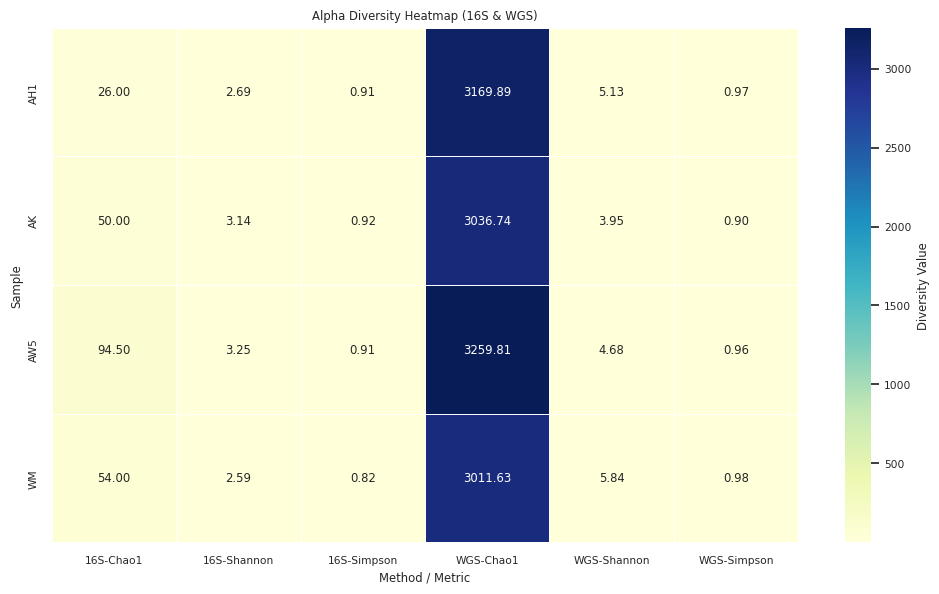

In [ ]:
import pandas as pd
import numpy as np
from skbio.diversity.alpha import shannon, simpson, chao1
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0).T
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0).T
samples = df_16s.index.tolist()

# Calculate indices
shannon_16s = df_16s.apply(lambda x: shannon(x.values), axis=1)
simpson_16s = df_16s.apply(lambda x: simpson(x.values), axis=1)
chao1_16s = df_16s.apply(lambda x: chao1(x.values), axis=1)
shannon_wgs = df_wgs.apply(lambda x: shannon(x.values), axis=1)
simpson_wgs = df_wgs.apply(lambda x: simpson(x.values), axis=1)
chao1_wgs = df_wgs.apply(lambda x: chao1(x.values), axis=1)

# Combine into a DataFrame for heatmap
heatmap_df = pd.DataFrame({
    ('16S', 'Shannon'): shannon_16s,
    ('16S', 'Simpson'): simpson_16s,
    ('16S', 'Chao1'): chao1_16s,
    ('WGS', 'Shannon'): shannon_wgs,
    ('WGS', 'Simpson'): simpson_wgs,
    ('WGS', 'Chao1'): chao1_wgs,
})
heatmap_df.columns = pd.MultiIndex.from_tuples(heatmap_df.columns)
heatmap_df = heatmap_df.sort_index(axis=1, level=0)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_df, annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5, cbar_kws={'label': 'Diversity Value'})
plt.title("Alpha Diversity Heatmap (16S & WGS)")
plt.ylabel("Sample")
plt.xlabel("Method / Metric")
plt.tight_layout()
plt.show()


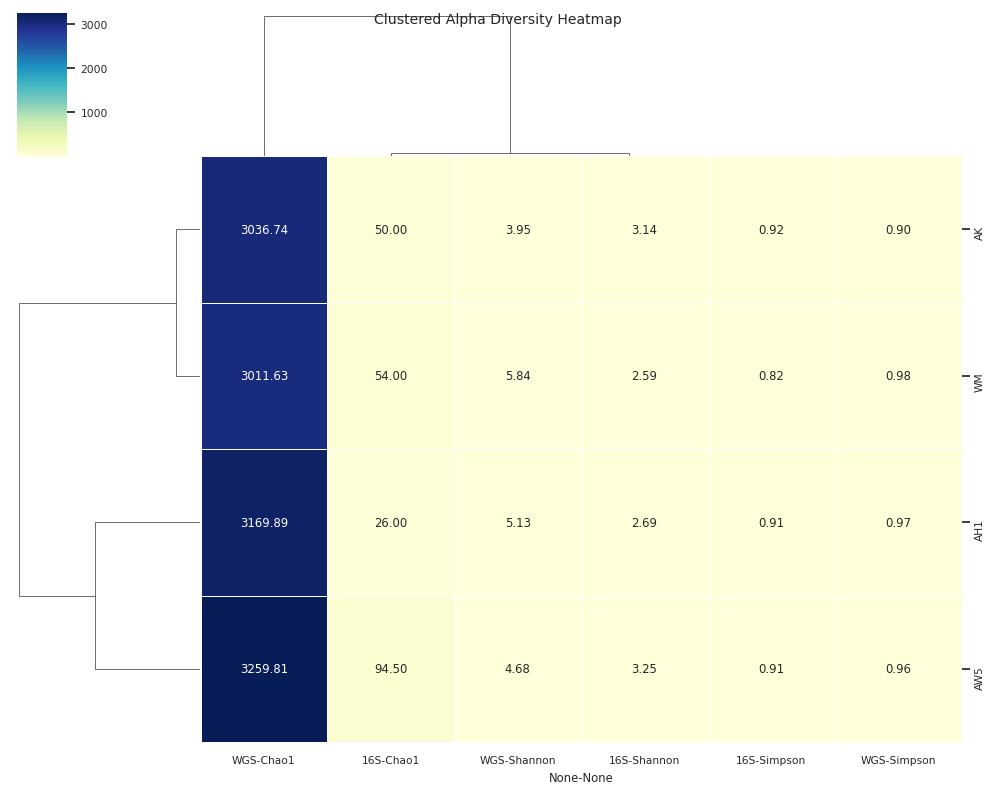

In [ ]:
sns.clustermap(heatmap_df, annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5, figsize=(10,8))
plt.suptitle("Clustered Alpha Diversity Heatmap")
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_16s and df_wgs are already loaded (not transposed)
# If you have already transposed them, remove .T below

# Find the top N genera by total abundance (across all samples and both methods)
N = 30
total_abundance = pd.concat([df_16s, df_wgs], axis=1).sum(axis=1)
top_genera = total_abundance.sort_values(ascending=False).head(N).index

# Subset and (optionally) normalize to relative abundance
df_16s_top = df_16s.loc[top_genera]
df_wgs_top = df_wgs.loc[top_genera]
df_16s_rel = df_16s_top.div(df_16s_top.sum(axis=0), axis=1)
df_wgs_rel = df_wgs_top.div(df_wgs_top.sum(axis=0), axis=1)

# Combine for heatmap: columns as Sample_Method (e.g., AH1_16S, AH1_WGS)
df_16s_rel.columns = [f"{col}_16S" for col in df_16s_rel.columns]
df_wgs_rel.columns = [f"{col}_WGS" for col in df_wgs_rel.columns]
df_combined = pd.concat([df_16s_rel, df_wgs_rel], axis=1)

# Transpose for heatmap: genera as rows, samples as columns
df_combined = df_combined

# Plot heatmap (genera on y-axis, samples on x-axis)
plt.figure(figsize=(max(10, int(len(df_combined.columns)/2)), max(8, int(N/2))))
sns.heatmap(df_combined, cmap="YlGnBu", linewidths=0.5, cbar_kws={'label': 'Relative Abundance'}, yticklabels=True)
plt.title("Genus Abundance Heatmap (Top {} Genera, 16S & WGS)".format(N))
plt.ylabel("Genus")
plt.xlabel("Sample_Method")
plt.tight_layout()
plt.show()


Beta Diversity

Combines your 16S and WGS data with sample-method labels

Computes Bray-Curtis distances (you can change to 'jaccard' for presence/absence)

Performs PCoA and plots the first two axes

Colors and shapes points by method (16S vs WGS)

Prints the coordinates for each sample for further analysis

In [ ]:
import pandas as pd

# Load (do NOT transpose)
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0)
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0)


In [ ]:
df_16s.columns = [f"{col}_16S" for col in df_16s.columns]
df_wgs.columns = [f"{col}_WGS" for col in df_wgs.columns]


In [ ]:
print("16S duplicates:", df_16s.index[df_16s.index.duplicated()].tolist())
print("WGS duplicates:", df_wgs.index[df_wgs.index.duplicated()].tolist())


16S duplicates: []
WGS duplicates: []


OR

In [ ]:
df_16s = df_16s.groupby(df_16s.index).sum()
df_wgs = df_wgs.groupby(df_wgs.index).sum()


In [ ]:
# Add method to sample names
df_16s.columns = [f"{col}_16S" for col in df_16s.columns]
df_wgs.columns = [f"{col}_WGS" for col in df_wgs.columns]

# Combine and transpose: now all sample names are unique
df_all = pd.concat([df_16s, df_wgs], axis=1)
df_all_t = df_all.T  # rows=samples, columns=genera

# Remove genera (columns) that are all zero
df_all_t = df_all_t.loc[:, (df_all_t.sum(axis=0) > 0)]


In [ ]:
df_all_t = df_all_t.fillna(0)


In [ ]:
print("Any NaN in data:", df_all_t.isnull().values.any())
print("Any inf in data:", np.isinf(df_all_t.values).any())


Any NaN in data: False
Any inf in data: False


PERMANOVA results (Bray-Curtis, Method=16S vs WGS):
method name               PERMANOVA
test statistic name        pseudo-F
sample size                       8
number of groups                  2
test statistic             6.683438
p-value                       0.026
number of permutations          999
Name: PERMANOVA results, dtype: object


<ipython-input-93-e7e30496deb8>:60: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xlabel(f"PC1 ({pcoa(bc_dm).proportion_explained[0]*100:.1f}%)")
<ipython-input-93-e7e30496deb8>:61: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.ylabel(f"PC2 ({pcoa(bc_dm).proportion_explained[1]*100:.1f}%)")


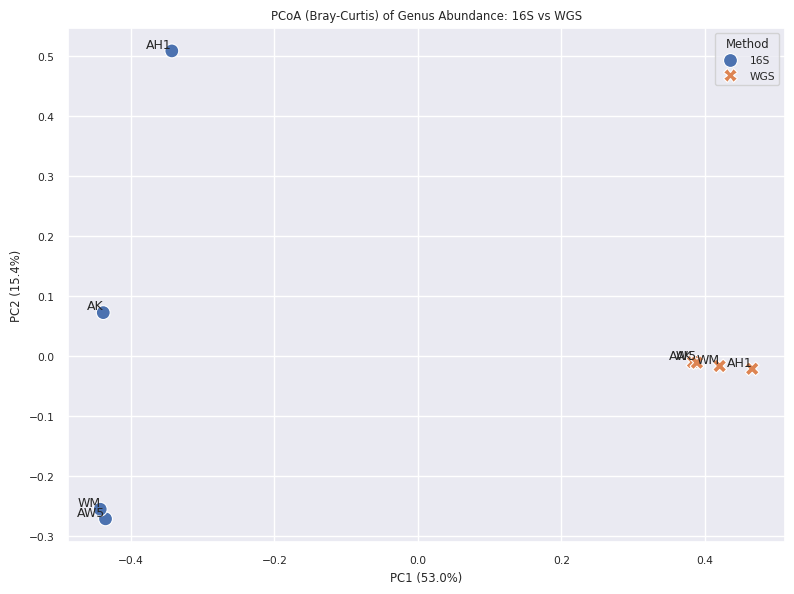

In [ ]:
import pandas as pd
import numpy as np
from skbio.diversity import beta_diversity
from skbio.stats.distance import permanova
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load data
df_16s = pd.read_csv('16s_Genus.txt', sep='\t', index_col=0)
df_wgs = pd.read_csv('WGS_Genus.txt', sep='\t', index_col=0)

# 2. Remove duplicate genus names (sum if duplicated)
df_16s = df_16s.groupby(df_16s.index).sum()
df_wgs = df_wgs.groupby(df_wgs.index).sum()

# 3. Add method to sample names
df_16s.columns = [f"{col}_16S" for col in df_16s.columns]
df_wgs.columns = [f"{col}_WGS" for col in df_wgs.columns]

# 4. Combine and transpose so rows=samples, columns=genera
df_all = pd.concat([df_16s, df_wgs], axis=1)
df_all_t = df_all.T  # rows=samples, columns=genera

# 5. Fill NaNs with zero (missing genus = absent in that sample)
df_all_t = df_all_t.fillna(0)

# 6. Remove samples with all zeros (if any)
df_all_t = df_all_t.loc[df_all_t.sum(axis=1) > 0]

# 7. Prepare grouping variable (metadata)
methods = ['16S' if '_16S' in s else 'WGS' for s in df_all_t.index]
metadata = pd.DataFrame({'Method': methods}, index=df_all_t.index)

# 8. Compute Bray-Curtis distance matrix
bc_dm = beta_diversity(
    metric='braycurtis',
    counts=df_all_t.values,
    ids=df_all_t.index
)

# 9. Run PERMANOVA
permanova_results = permanova(distance_matrix=bc_dm, grouping=metadata['Method'])
print("PERMANOVA results (Bray-Curtis, Method=16S vs WGS):")
print(permanova_results)

# 10. (Optional) PCoA plot for visualization
from skbio.stats.ordination import pcoa
coords = pcoa(bc_dm).samples
coords['Method'] = metadata['Method'].values
coords['Sample'] = [i.split('_')[0] for i in coords.index]

plt.figure(figsize=(8,6))
sns.scatterplot(
    x=coords['PC1'], y=coords['PC2'],
    hue=coords['Method'], style=coords['Method'],
    s=100
)
for i, row in coords.iterrows():
    plt.text(row['PC1'], row['PC2'], row['Sample'], fontsize=9, ha='right', va='bottom')
plt.xlabel(f"PC1 ({pcoa(bc_dm).proportion_explained[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pcoa(bc_dm).proportion_explained[1]*100:.1f}%)")
plt.title("PCoA (Bray-Curtis) of Genus Abundance: 16S vs WGS")
plt.legend(title='Method')
plt.tight_layout()
plt.show()
